In [1]:
import pandas as pd 
import numpy as np 
from sklearn.tree import DecisionTreeClassifier 
from sklearn import tree
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix , roc_auc_score, roc_curve 
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv('winequality_red.csv')

In [3]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
x = df.drop(columns = 'quality')

In [6]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [7]:
y = df['quality']

In [8]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [9]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = .20, random_state = 300)

In [10]:
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [11]:
dt_model.predict(x_test)

array([6, 5, 5, 7, 5, 5, 5, 5, 5, 6, 4, 6, 6, 6, 5, 6, 6, 6, 4, 5, 6, 7,
       6, 5, 7, 7, 5, 5, 7, 5, 6, 7, 6, 5, 7, 5, 5, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 5, 6, 7, 6, 6, 5, 5, 6, 5, 6, 7, 5, 6, 6, 6, 7, 5, 7, 8, 5,
       7, 6, 4, 6, 5, 6, 6, 7, 6, 5, 8, 5, 6, 5, 5, 6, 6, 6, 7, 7, 5, 5,
       6, 4, 6, 6, 5, 7, 5, 4, 7, 6, 5, 5, 7, 5, 6, 6, 5, 7, 5, 5, 5, 7,
       6, 5, 5, 6, 5, 6, 4, 6, 6, 5, 6, 5, 6, 6, 6, 7, 5, 5, 6, 6, 5, 5,
       5, 5, 6, 6, 6, 7, 5, 5, 6, 5, 6, 5, 6, 6, 5, 5, 6, 5, 6, 7, 7, 5,
       4, 6, 5, 6, 6, 5, 5, 5, 6, 6, 5, 6, 6, 5, 6, 6, 7, 5, 6, 6, 6, 7,
       5, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5, 5, 6, 4, 6, 6, 6, 6,
       6, 5, 5, 6, 6, 6, 5, 7, 5, 6, 5, 5, 5, 6, 7, 5, 5, 7, 5, 7, 5, 7,
       5, 5, 5, 5, 6, 7, 5, 5, 5, 5, 6, 6, 5, 7, 6, 5, 6, 5, 6, 6, 5, 6,
       5, 6, 7, 5, 5, 5, 5, 5, 7, 5, 6, 6, 5, 7, 6, 6, 5, 7, 6, 6, 5, 5,
       6, 7, 6, 5, 6, 4, 5, 6, 5, 6, 6, 5, 5, 6, 5, 7, 7, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 7, 6, 6, 7, 5, 6, 5,

In [12]:
dt_model.score(x_test, y_test)

0.6

In [13]:
dt_entropy = DecisionTreeClassifier(criterion = "entropy")
dt_entropy.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy')

In [14]:
dt_entropy.score(x_test, y_test)

0.603125

In [15]:
import sklearn
import matplotlib.pyplot as plt
from sklearn  import tree
%matplotlib inline

In [16]:
sklearn.__version__

'0.24.2'

In [17]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model, field = True)

TypeError: plot_tree() got an unexpected keyword argument 'field'

<Figure size 1440x1440 with 0 Axes>

In [ ]:
df

In [ ]:
df1 = df.head(500)

In [ ]:
x1=df1.drop(columns ='quality')

In [ ]:
y1= df1.quality

In [ ]:
df.model1 = DecisionTreeClassifier()
df.model1.fit(x1,y1)

In [ ]:
plt.figure(figsize=(20,20))
tree.plot_tree(df.model1, filled = True)


In [ ]:
df1

In [ ]:
df.model1.predict(x1)

In [ ]:
df.model1.score(x1,y1)

In [ ]:
df. model1.score(x_test, y_test)

In [ ]:
path = df.model1.cost_complexity_pruning_path(x1,y1)
ccp_alpha = path['ccp_alphas']

In [ ]:
ccp_alpha

In [ ]:
df_model2 =[]
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    df_model2.append(dt_m)

In [ ]:
df_model2

In [ ]:
train_score = [i.score(x1,y1)for i in df_model2]

In [ ]:
test_score = [i.score(x_test, y_test) for i in df_model2]

In [ ]:
train_score

In [ ]:
test_score

In [ ]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [ ]:
dt_model_ccp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.14)
dt_model_ccp.fit(x1,y1)

In [ ]:
dt_model_ccp.score(x1,y1)

In [ ]:
dt_model_ccp.score(x_test, y_test)

In [18]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [19]:
x = df.drop(columns = ['quality'])

In [20]:
y = df.quality

In [21]:
from sklearn.ensemble import BaggingClassifier

In [23]:
x_train, x_test, y_train, y_test = train_test_split(x,y,random_state =0 )

In [30]:
bag_dt

NameError: name 'bag_dt' is not defined

In [24]:
BaggingClassifier(base_estimator = DecisionTreeClassifier())

BaggingClassifier(base_estimator=DecisionTreeClassifier())

In [27]:
bag_dt.predict(x_test)

NameError: name 'bag_dt' is not defined

In [31]:
from sklearn.ensemble import RandomForestClassifier

In [46]:
rf = RandomForestClassifier(n_estimators=5)

In [47]:
rf.fit(x_train, y_train)

RandomForestClassifier(n_estimators=5)

In [48]:
rf.score(x_test, y_test)

0.6775

In [49]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=734238631),
 DecisionTreeClassifier(max_features='auto', random_state=432978240),
 DecisionTreeClassifier(max_features='auto', random_state=2023533585),
 DecisionTreeClassifier(max_features='auto', random_state=1776158603),
 DecisionTreeClassifier(max_features='auto', random_state=1291766551)]

In [50]:
rf.estimators_[0]

DecisionTreeClassifier(max_features='auto', random_state=734238631)

[Text(431.41169360597786, 1069.0800000000002, 'X[1] <= 0.405\ngini = 0.639\nsamples = 764\nvalue = [7, 43, 513, 481, 148, 7]'),
 Text(257.7875268202902, 1032.8400000000001, 'X[6] <= 49.5\ngini = 0.638\nsamples = 201\nvalue = [0, 2, 63, 152, 85, 6]'),
 Text(141.65678468135386, 996.6, 'X[9] <= 0.805\ngini = 0.633\nsamples = 150\nvalue = [0, 2, 36, 114, 78, 6]'),
 Text(56.29176320889151, 960.36, 'X[8] <= 3.13\ngini = 0.621\nsamples = 109\nvalue = [0, 2, 36, 93, 39, 4]'),
 Text(23.740842473601692, 924.12, 'X[7] <= 1.0\ngini = 0.245\nsamples = 18\nvalue = [0, 0, 4, 24, 0, 0]'),
 Text(11.870421236800846, 887.88, 'X[9] <= 0.795\ngini = 0.147\nsamples = 15\nvalue = [0, 0, 2, 23, 0, 0]'),
 Text(5.935210618400423, 851.6400000000001, 'gini = 0.0\nsamples = 14\nvalue = [0, 0, 0, 23, 0, 0]'),
 Text(17.80563185520127, 851.6400000000001, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 2, 0, 0, 0]'),
 Text(35.61126371040254, 887.88, 'X[1] <= 0.315\ngini = 0.444\nsamples = 3\nvalue = [0, 0, 2, 1, 0, 0]'),
 Te

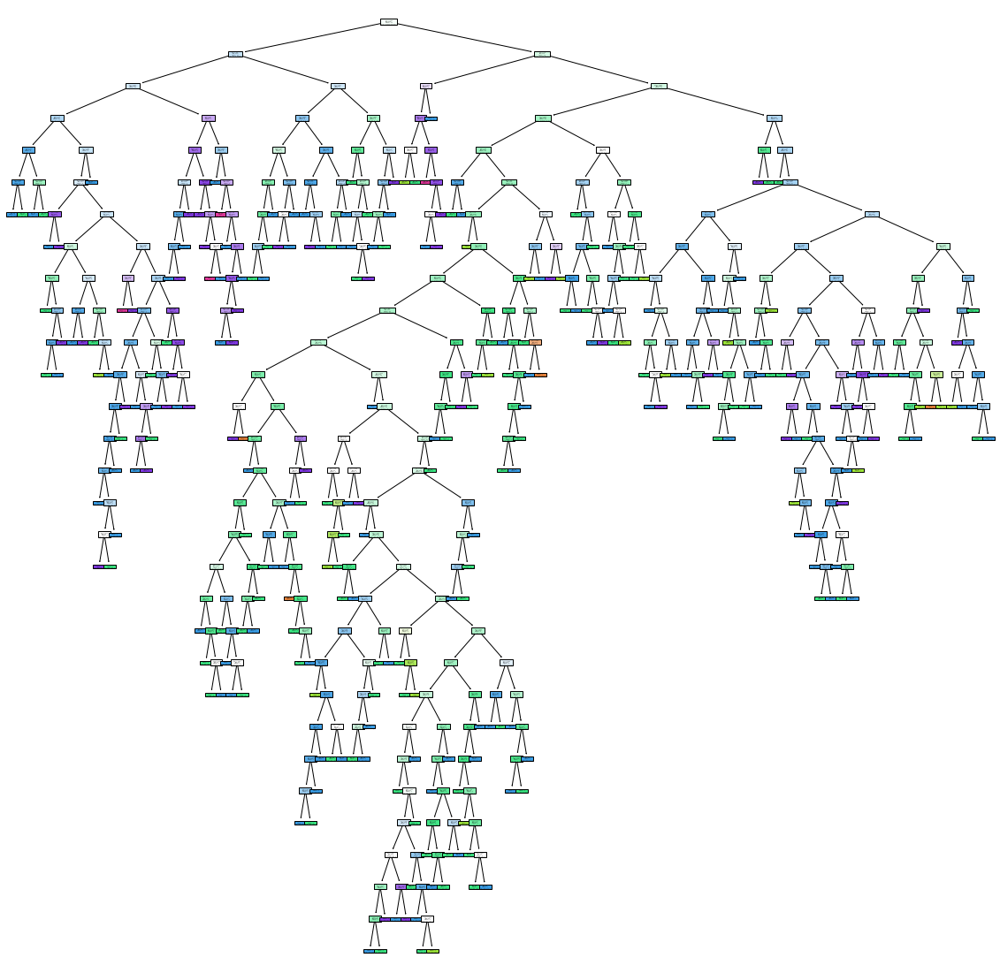

In [51]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf.estimators_[0], filled = True)

In [ ]:
grid_param = {
    "n_estimators" : [5, 10, 50, 100, 120, 150],
    "criterion" : ['gini', 'entropy'],
    "max_depth" :
    
}

In [ ]:
GridSearch